<a href="https://colab.research.google.com/github/noahgift/data-story-telling/blob/main/Data_Story_Telling.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Data Story Telling

# Ingest

Sources



*   [Datascience meets intermittent fasting](https://noahgift.com/articles/datascience-meets-intermittent-fasting/)
*   List item



# EDA

## Approximately 10 Years of Bodyweight

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

In [ ]:
df = pd.read_csv("https://raw.githubusercontent.com/noahgift/intermittent-fasting/master/weight.csv")
df.head()

,Date,Weight (lb)
0,12/22/2019,222.9
1,12/18/2019,222.0
2,12/15/2019,222.2
3,12/7/2019,219.3
4,12/1/2019,220.4


Create datetime index

In [ ]:
df['Datetime'] = pd.to_datetime(df['Date'])
df = df.set_index('Datetime')
df = df.drop(['Date'], axis=1)
df.head()

,Weight (lb)
Datetime,
2019-12-22,222.9
2019-12-18,222.0
2019-12-15,222.2
2019-12-07,219.3
2019-12-01,220.4


In [ ]:
df.columns

Index(['Weight (lb)'], dtype='object')

### Descriptive Statistics

In [ ]:
df.describe()

,Weight (lb)
count,1013.000000
mean,225.407601
std,4.813612
min,213.400000
25%,221.900000
50%,224.400000
75%,228.000000
max,245.200000


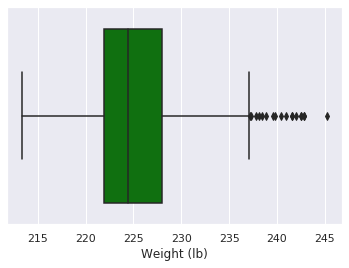

In [ ]:
sns.boxplot(x=df["Weight (lb)"], color="green")

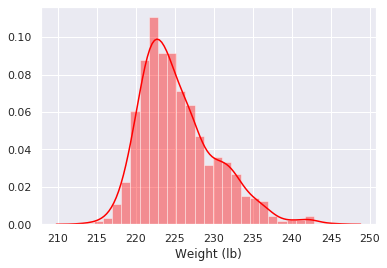

In [ ]:
sns.distplot(df["Weight (lb)"], color="red")

### Time Series Plot

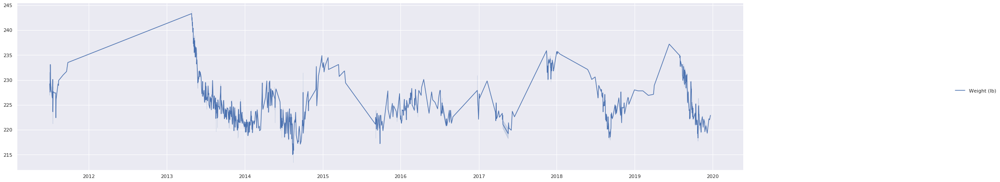

In [ ]:
g = sns.relplot(data=df, kind="line", ci=68)
g.fig.set_size_inches(35,6)
g.set_titles("Body Weight 2011-2019")

This notebook is featured in [Practical MLOps book by O'Reilly](https://learning.oreilly.com/library/view/practical-mlops/9781098103002/) as well a Coursera + Duke Course.

## MLB-EDA

In [ ]:
df.describe()

,Height,Weight,Age
count,1033.000000,1033.000000,1033.000000
mean,73.698935,201.689255,28.737648
std,2.306330,20.991491,4.322298
min,67.000000,150.000000,20.900000
25%,72.000000,187.000000,25.440000
50%,74.000000,200.000000,27.930000
75%,75.000000,215.000000,31.240000
max,83.000000,290.000000,48.520000


What about positions?  What can we infer about a typical player from different positions?

In [ ]:
df_positions = df.groupby("Position").median()
df_positions.reset_index(inplace=True)
df_positions

,Position,Height,Weight,Age
0,Catcher,73.0,205.0,30.060
1,Designated_Hitter,74.5,224.5,29.200
2,First_Baseman,74.0,220.0,28.800
3,Outfielder,73.0,200.0,28.140
4,Relief_Pitcher,74.0,200.0,27.560
5,Second_Baseman,72.0,185.0,28.435
6,Shortstop,72.0,180.0,27.800
7,Starting_Pitcher,74.5,205.0,27.390
8,Third_Baseman,73.0,200.0,27.900


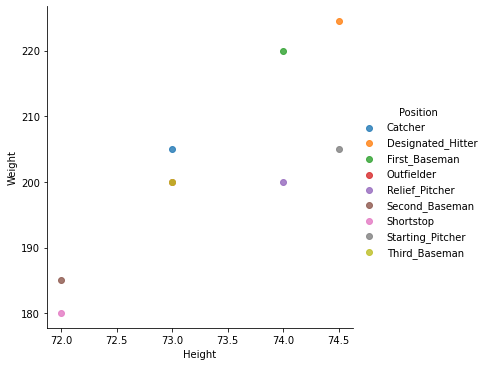

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

sns.lmplot(x="Height", y="Weight",data=df_positions, hue="Position")

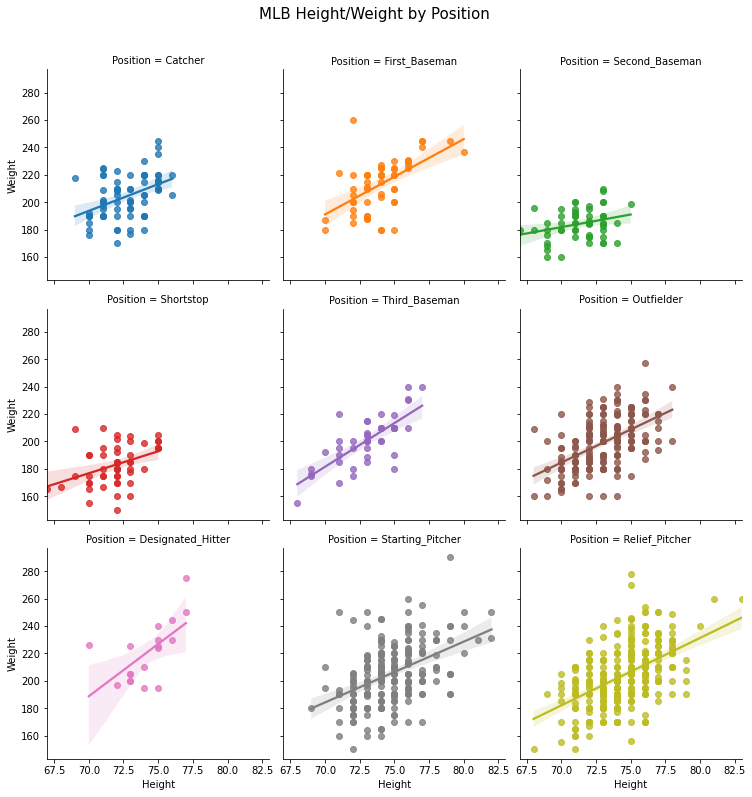

In [ ]:
import matplotlib.pyplot as plt
g = sns.FacetGrid(df, col="Position", height=3.5, col_wrap=3, hue="Position")
g.fig.suptitle("MLB Height/Weight by Position", fontsize=15, y=1.05)
g.map(sns.regplot, "Height", "Weight")

## Modeling

In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler

### Select Feature

Using Weight to Predict Height, so just one feature


In [ ]:
var = df['Height'].values
var.shape

(1033,)

In [ ]:
y = df['Height'].values #Target
y = y.reshape(-1, 1)
X = df['Weight'].values #Feature(s)
X = X.reshape(-1,1)

In [ ]:
X.shape

(1033, 1)

In [ ]:
y.shape

(1033, 1)

### Split Data and Scale Data

Scaling workflow step by step to make it easier to understand

In [ ]:
scaler = StandardScaler()

In [ ]:
X_scaler = scaler.fit(X)
X


array([[180.],
       [215.],
       [210.],
       ...,
       [205.],
       [190.],
       [195.]])

In [ ]:
X = X_scaler.transform(X)
X

array([[-1.0337408 ],
       [ 0.6344091 ],
       [ 0.39610197],
       ...,
       [ 0.15779485],
       [-0.55712654],
       [-0.31881941]])

In [ ]:
y_scaler = scaler.fit(y)
y

array([[74],
       [74],
       [72],
       ...,
       [75],
       [75],
       [73]])

In [ ]:
y = y_scaler.transform(y)
y

array([[ 0.13060176],
       [ 0.13060176],
       [-0.73699706],
       ...,
       [ 0.56440117],
       [ 0.56440117],
       [-0.30319765]])

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.1)
print(X_train.shape, y_train.shape)
print(X_test.shape, y_test.shape)

(929, 1) (929, 1)
(104, 1) (104, 1)


### Fit the model

In [ ]:
from sklearn.linear_model import Ridge
clf = Ridge()
model = clf.fit(X_train, y_train)
predictions = clf.predict(X_test)

In [ ]:
y_test.shape

(104, 1)

In [ ]:
predictions.shape

(104, 1)

unscaled predictions, converted to DataFrame and described

In [ ]:
df_predictions = pd.DataFrame(predictions)
df.describe()

,0
count,104.000000
mean,-0.052927
std,0.567257
min,-1.068324
25%,-0.499268
50%,-0.045303
75%,0.280785
max,2.256493


### Plot Predictions

Let's inverse scale back to view predictions in a form we can understand, then plot

In [ ]:
df_inverse_scaled_prediction = pd.DataFrame(y_scaler.inverse_transform(y))
df_inverse_scaled_prediction.describe()

,0
count,1033.000000
mean,73.698935
std,2.306330
min,67.000000
25%,72.000000
50%,74.000000
75%,75.000000
max,83.000000


/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


Text(0, 0.5, 'Predicted Height')

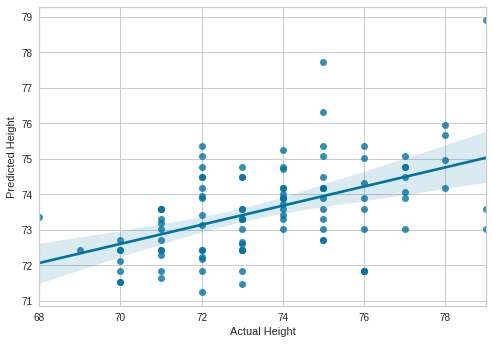

In [ ]:
plot = sns.regplot(y_scaler.inverse_transform(y_test), y_scaler.inverse_transform(predictions))
plt.xlabel("Actual Height")
plt.ylabel("Predicted Height")

### Print Accuracy of Linear Regression Model

In [ ]:
model.score(X_test, y_test)

0.24428534170324856

## Sugar and Education

### Data Cleaning

#### CDC 2013 Source

TABLE 3. Crude prevalence* of sugar-sweetened beverage† consumption ≥1 time/day among adults, by employment status, education, and state — Behavioral Risk Factor Surveillance System, 23 states and District of Columbia, 2013

https://www.cdc.gov/mmwr/volumes/65/wr/mm6507a1.htm

In [8]:
import pandas as pd


In [9]:
cdc_2013 = pd.read_csv("https://raw.githubusercontent.com/noahgift/sugar/master/data/education_sugar_cdc_2003.csv")
cdc_2013.set_index("State", inplace=True)
cdc_2013.head()

,Employed,Not employed,Retired,<High school,High school,Some college,College graduate
State,,,,,,,
Alaska,26.2 (23.6–28.9),32.1 (27.8–36.8),16.0 (12.6–20.2),47.1 (37.8–56.5),34.9 (31.1–38.9),24.2 (21.0–27.8),12.9 (10.5–15.7)
Arizona,33.0 (28.5–37.8),28.7 (23.5–34.5),13.8 (10.8–17.5),40.4 (30.9–50.7),36.5 (30.7–42.7),24.4 (19.9–29.4),14.6 (11.6–18.3)
California,22.9 (20.9–25.1),30.2 (27.1–33.4),15.0 (12.2–18.2),38.5 (34.2–43.0),29.9 (26.5–33.7),21.4 (18.8–24.2),11.5 (9.8–13.5)
Connecticut,18.9 (17.1–20.9),24.3 (20.8–28.2),15.0 (12.7–17.7),27.8 (22.4–33.9),26.9 (23.7–30.3),19.9 (17.2–23.0),10.2 (8.7–12.0)
District of Columbia,18.5 (15.7–21.7),34.6 (29.5–40.1),18.5 (15.3–22.1),45.6 (36.4–55.2),39.0 (33.1–45.2),28.9 (23.4–35.0),8.4 (7.0–10.1)


In [10]:
for column in cdc_2013.columns:
  cdc_2013[column]=cdc_2013[column].str.replace(r"\(.*\)","")
  cdc_2013[column]=pd.to_numeric(cdc_2013[column])
  
cdc_2013.reset_index(inplace=True) 
cdc_2013.head()
  

,State,Employed,Not employed,Retired,<High school,High school,Some college,College graduate
0,Alaska,26.2,32.1,16.0,47.1,34.9,24.2,12.9
1,Arizona,33.0,28.7,13.8,40.4,36.5,24.4,14.6
2,California,22.9,30.2,15.0,38.5,29.9,21.4,11.5
3,Connecticut,18.9,24.3,15.0,27.8,26.9,19.9,10.2
4,District of Columbia,18.5,34.6,18.5,45.6,39.0,28.9,8.4


In [11]:
cdc_2013.describe()

,Employed,Not employed,Retired,<High school,High school,Some college,College graduate
count,24.000000,24.000000,24.000000,24.000000,24.000000,24.000000,24.000000
mean,32.325000,35.408333,18.533333,44.662500,37.416667,30.262500,17.358333
std,9.917803,9.056485,5.975142,8.588658,8.243399,8.490138,6.730264
min,16.700000,21.500000,8.900000,27.800000,21.500000,16.900000,7.800000
25%,23.400000,29.750000,14.625000,39.625000,31.925000,24.200000,12.850000
50%,31.550000,32.600000,16.750000,46.350000,36.750000,28.200000,15.300000
75%,42.025000,46.025000,22.550000,51.200000,46.525000,39.250000,23.500000
max,49.700000,49.500000,29.700000,60.000000,50.800000,47.200000,34.900000


### Education and Sugar


In [12]:
!wget https://raw.githubusercontent.com/python-visualization/folium/master/examples/data/us-states.json
!ls -l

--2021-03-13 12:45:30--  https://raw.githubusercontent.com/python-visualization/folium/master/examples/data/us-states.json
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 87688 (86K) [text/plain]
Saving to: ‘us-states.json.1’

us-states.json.1    100%[===================>]  85.63K  --.-KB/s    in 0.02s   

2021-03-13 12:45:30 (5.46 MB/s) - ‘us-states.json.1’ saved [87688/87688]

total 180
drwxr-xr-x 1 root root  4096 Mar  5 14:37 sample_data
-rw-r--r-- 1 root root 87688 Mar 13 12:44 us-states.json
-rw-r--r-- 1 root root 87688 Mar 13 12:45 us-states.json.1


#### Low Education == High Sugar

In [13]:
import folium
m = folium.Map(location=[36, -102], zoom_start=3)

folium.Choropleth(
    geo_data="us-states.json",
    name='choropleth',
    data=cdc_2013,
    columns=['State', '<High school'],
    key_on='feature.properties.name',
    fill_color='OrRd',
    fill_opacity=0.7,
    line_opacity=0.2,
    legend_name='<High school Education and Grams Sugar Intake Daily'
).add_to(m)

folium.LayerControl().add_to(m)

m

#### College Education Major Decrease in Sugar Intake

In [15]:
import folium
m = folium.Map(location=[36, -102], zoom_start=3)

folium.Choropleth(
    geo_data="us-states.json",
    name='choropleth',
    data=cdc_2013,
    columns=['State', 'College graduate'],
    key_on='feature.properties.name',
    fill_color='OrRd',
    fill_opacity=0.7,
    line_opacity=0.2,
    legend_name='College graduate and Grams Sugar Intake Daily'
).add_to(m)

folium.LayerControl().add_to(m)

m

### Median Daily Sugar Intake by Category

In [18]:
cdc_2013.columns

Index(['State', 'Employed', 'Not employed', 'Retired', '<High school',
       'High school', 'Some college', 'College graduate'],
      dtype='object')

College Graduate

In [19]:
cdc_2013["College graduate"].median()

15.3

In [20]:
cdc_2013["<High school"].median()

46.35

Text(0.5, 1.0, 'CDC 2013: Three Times Higher Sugar Intake College vs High School Grads')

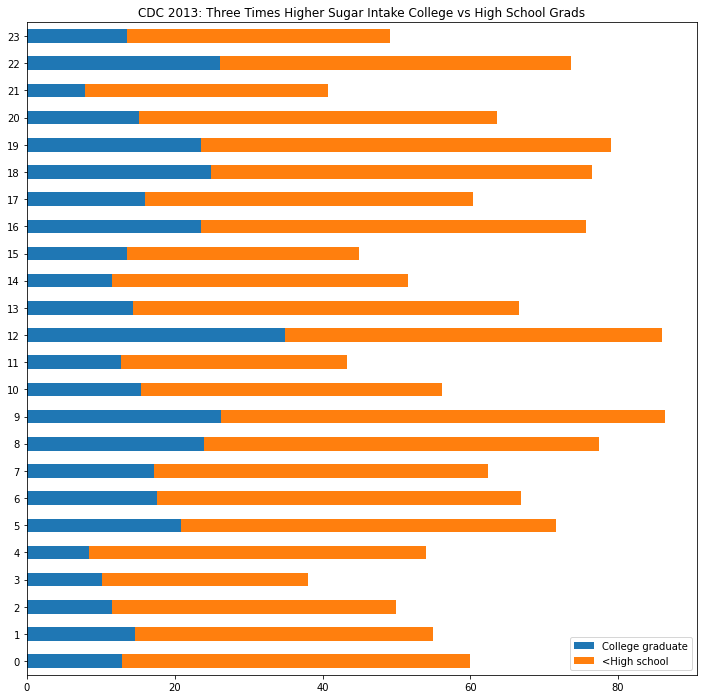

In [21]:
cdc_2013[["State","College graduate", "<High school"]].plot.barh(
    stacked=True, figsize=(12, 12)).set_title("CDC 2013: Three Times Higher Sugar Intake College vs High School Grads")

## Health and Covid-19

### Ingest

*COVID-19 Data from [New York Times Github](https://github.com/nytimes/covid-19-data)*

In [ ]:
import pandas as pd
df = pd.read_csv("https://raw.githubusercontent.com/nytimes/covid-19-data/master/us-states.csv")
df.head()

,date,state,fips,cases,deaths
0,2020-01-21,Washington,53,1,0
1,2020-01-22,Washington,53,1,0
2,2020-01-23,Washington,53,1,0
3,2020-01-24,Illinois,17,1,0
4,2020-01-24,Washington,53,1,0


Last five rows

In [ ]:
df.tail()

,date,state,fips,cases,deaths
1934,2020-04-06,Virginia,51,2878,54
1935,2020-04-06,Washington,53,8384,383
1936,2020-04-06,West Virginia,54,345,4
1937,2020-04-06,Wisconsin,55,2440,83
1938,2020-04-06,Wyoming,56,212,0


*What are the columns?*

In [ ]:
df.columns

Index(['date', 'state', 'fips', 'cases', 'deaths'], dtype='object')

*What is the shape:  i.e. rows,columns?*

In [ ]:
df.shape

(1939, 5)

### EDA

*What are general characteristics of the data?  A good way to find out is `df.describe`*

In [ ]:
df.describe()

,fips,cases,deaths
count,1939.000000,1939.000000,1939.000000
mean,30.892728,1467.224342,34.104177
std,18.062123,7403.847224,210.798255
min,1.000000,1.000000,0.000000
25%,17.000000,7.000000,0.000000
50%,30.000000,75.000000,1.000000
75%,46.000000,565.000000,10.000000
max,78.000000,130703.000000,4758.000000


*Cases and Deaths in the USA due to Covid-19*

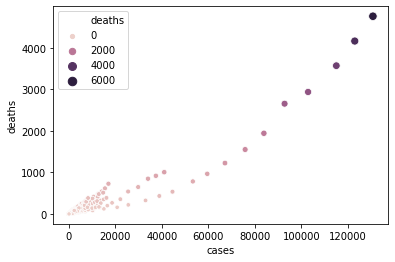

In [ ]:
import seaborn as sns
sns.scatterplot(x="cases", y="deaths", 
                hue="deaths",size="deaths", data=df)

### Date-based EDA

*Dealing with dates by setting index*

In [ ]:
df = pd.read_csv("https://raw.githubusercontent.com/nytimes/covid-19-data/master/us-states.csv")
df["date"] = pd.to_datetime(df["date"])
df = df.set_index("date")
print(f"Columns: {df.columns}")
df.index

Columns: Index(['state', 'fips', 'cases', 'deaths'], dtype='object')


DatetimeIndex(['2020-01-21', '2020-01-22', '2020-01-23', '2020-01-24',
               '2020-01-24', '2020-01-25', '2020-01-25', '2020-01-25',
               '2020-01-26', '2020-01-26',
               ...
               '2020-04-06', '2020-04-06', '2020-04-06', '2020-04-06',
               '2020-04-06', '2020-04-06', '2020-04-06', '2020-04-06',
               '2020-04-06', '2020-04-06'],
              dtype='datetime64[ns]', name='date', length=1939, freq=None)

*Filter results by date range*

In [ ]:
from datetime import date, timedelta
today = date.today()
daybefore = today - timedelta(days = 2)
print(f"Today {today}")
print(f"Two days ago {daybefore}") 

Today 2020-04-08
Two days ago 2020-04-06


In [ ]:
df.loc[daybefore:today].head()

,state,fips,cases,deaths
date,,,,
2020-04-06,Alabama,1,2006,53
2020-04-06,Alaska,2,189,4
2020-04-06,Arizona,4,2465,67
2020-04-06,Arkansas,5,927,16
2020-04-06,California,6,16284,386


*The distribution of the data by date*

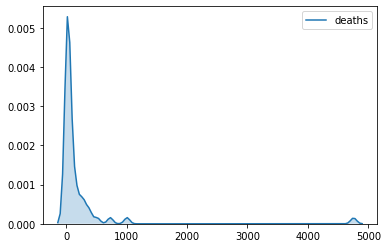

In [ ]:
sns.kdeplot(df.loc[daybefore:today]["deaths"], shade=True)

*Sort DataFrame in place by states with highest deaths and cases and show first 10 results*

In [ ]:
current_df = df.loc[daybefore:today].sort_values(by=["deaths", "cases"], ascending=False)
current_df.head(10)

,state,fips,cases,deaths
date,,,,
2020-04-06,New York,36,130703,4758
2020-04-06,New Jersey,34,41090,1005
2020-04-06,Michigan,26,17130,727
2020-04-06,Louisiana,22,14867,512
2020-04-06,California,6,16284,386
2020-04-06,Washington,53,8384,383
2020-04-06,Illinois,17,12262,309
2020-04-06,Georgia,13,7558,294
2020-04-06,Massachusetts,25,13837,260


*There should be 50 states and District of Columbia*

In [ ]:
current_df.shape

(55, 4)

### State Based Analysis

*Get 10 states and subset*

In [ ]:
top_ten_states = list(current_df["state"].head(10).values)
top_ten_states

['New York',
 'New Jersey',
 'Michigan',
 'Louisiana',
 'California',
 'Washington',
 'Illinois',
 'Georgia',
 'Massachusetts',
 'Florida']

In [ ]:
top_states_df = df[df['state'].isin(top_ten_states)].drop(columns="fips")

*Verify the unique states left is the same 10*

In [ ]:
set(top_states_df.state.values)

{'California',
 'Florida',
 'Georgia',
 'Illinois',
 'Louisiana',
 'Massachusetts',
 'Michigan',
 'New Jersey',
 'New York',
 'Washington'}

<Figure size 1080x360 with 0 Axes>

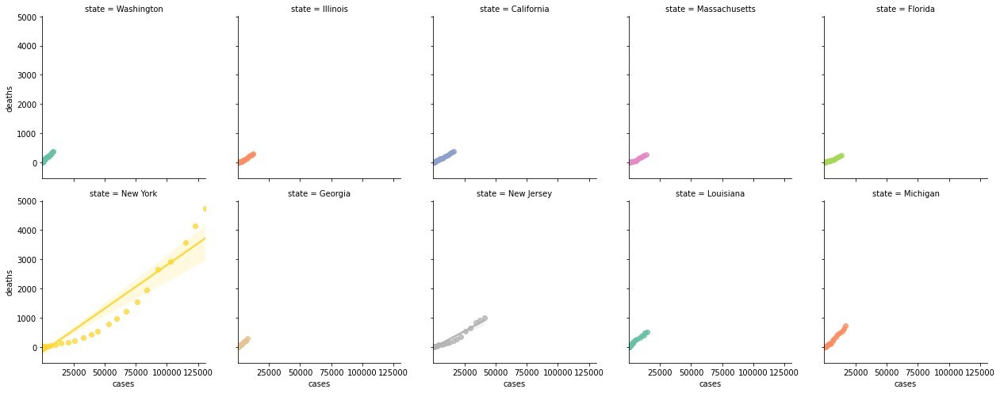

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(15,5))
ax = sns.lmplot(x="cases", y="deaths",
                    height=3.5,
                    col="state",
                    col_wrap=5,
                    hue="state", 
                    palette="Set2",
                    data=top_states_df)
ax.fig.subplots_adjust(wspace=.2)

*Interactive plot of top states*

In [ ]:
top_states_march_current_df = top_states_df.loc["2020-03-08":today].sort_values(by=["deaths", "cases"], ascending=True)
top_states_march_current_df.head()

,state,cases,deaths
date,,,
2020-03-09,Louisiana,1,0
2020-03-10,Michigan,2,0
2020-03-11,Michigan,2,0
2020-03-08,New Jersey,6,0
2020-03-10,Louisiana,6,0


In [ ]:
import plotly.io as pio
pio.renderers.default = 'colab'
import plotly.express as px
fig = px.scatter(top_states_march_current_df, x=top_states_march_current_df.index, y="cases", size="deaths", color="state", facet_col="state")
fig.show()

### Search for Features:  Political, Health and Finance

*Sugar Intake By State*

In [ ]:
cdc_2013 = pd.read_csv("https://raw.githubusercontent.com/noahgift/sugar/master/data/education_sugar_cdc_2003.csv")
cdc_2013.set_index("State", inplace=True)
for column in cdc_2013.columns:
  cdc_2013[column]=cdc_2013[column].str.replace(r"\(.*\)","")
  cdc_2013[column]=pd.to_numeric(cdc_2013[column])
  
cdc_2013.reset_index(inplace=True)
cdc_2013.rename(columns={"State": "state", "Employed": "employed-sugar-intake-daily"},inplace=True)
cdc_2013.head()

,state,employed-sugar-intake-daily,Not employed,Retired,<High school,High school,Some college,College graduate
0,Alaska,26.2,32.1,16.0,47.1,34.9,24.2,12.9
1,Arizona,33.0,28.7,13.8,40.4,36.5,24.4,14.6
2,California,22.9,30.2,15.0,38.5,29.9,21.4,11.5
3,Connecticut,18.9,24.3,15.0,27.8,26.9,19.9,10.2
4,District of Columbia,18.5,34.6,18.5,45.6,39.0,28.9,8.4


*Combine Sugar Data and Covid-19 Data*

In [ ]:
cdc_employed_df = cdc_2013[["employed-sugar-intake-daily", "state"]]
sugar_covid_df = df.merge(cdc_employed_df, how="inner", on="state")
sugar_covid_df.head()

,state,fips,cases,deaths,employed-sugar-intake-daily
0,California,6,1,0,22.9
1,California,6,2,0,22.9
2,California,6,2,0,22.9
3,California,6,2,0,22.9
4,California,6,2,0,22.9


*What about data from the 2016 Election?*

In [ ]:
election_df = pd.read_csv("https://raw.githubusercontent.com/paiml/minimal-python/master/data/2016-Electoral-Votes.csv")
election_df.rename(columns={"State": "state"},inplace=True)
election_df.drop(columns="Votes", inplace=True)
election_df = pd.concat([election_df, pd.get_dummies(election_df["Winning Party"])], axis=1);
election_df.head()
#election_df["Republican?"] = pd.get_dummies(election_df, columns=["Winning Party"])
#election_df.head()

,state,Winning Party,Democrats,Republicans
0,Alabama,Republicans,0,1
1,Alaska,Republicans,0,1
2,Arizona,Republicans,0,1
3,Arkansas,Republicans,0,1
4,California,Democrats,1,0


In [ ]:
sugar_covid_df = sugar_covid_df.merge(election_df, how="inner", on="state")
sugar_covid_df.head()

,state,fips,cases,deaths,employed-sugar-intake-daily,Winning Party,Democrats,Republicans
0,California,6,1,0,22.9,Democrats,1,0
1,California,6,2,0,22.9,Democrats,1,0
2,California,6,2,0,22.9,Democrats,1,0
3,California,6,2,0,22.9,Democrats,1,0
4,California,6,2,0,22.9,Democrats,1,0


*Generate Heatmap*

In [ ]:
sugar_covid_df.corr()

,fips,cases,deaths,employed-sugar-intake-daily,Democrats,Republicans
fips,1.000000,0.053269,0.042491,0.231301,-0.228550,0.228550
cases,0.053269,1.000000,0.961783,-0.148097,0.221247,-0.221247
deaths,0.042491,0.961783,1.000000,-0.119988,0.178478,-0.178478
employed-sugar-intake-daily,0.231301,-0.148097,-0.119988,1.000000,-0.761812,0.761812
Democrats,-0.228550,0.221247,0.178478,-0.761812,1.000000,-1.000000
Republicans,0.228550,-0.221247,-0.178478,0.761812,-1.000000,1.000000


In [ ]:
import plotly.graph_objects as go

fig = go.Figure(data=go.Heatmap(
                   z=sugar_covid_df.corr(),
                   x=['fips','cases', 'deaths', 'employed-sugar-intake-daily', 'Democrats', 'Republicans'],
                   y=['fips','cases', 'deaths', 'employed-sugar-intake-daily', 'Democrats', 'Republicans'],
                   hoverongaps = False))
fig.show()

In [ ]:
sugar_covid_df.to_csv("covid-eda.csv")

*What about Real-Estate Data?*

## Matthew-Effect-Home-Price-Clustering

Unsupervised Machine Learning technique that discovers hidden labels

#### Exploration of Zillow Home Prices 


##### Ingest

In [ ]:
import pandas as pd
pd.set_option('display.float_format', lambda x: '%.3f' % x)
import numpy as np
import statsmodels.api as sm
import statsmodels.formula.api as smf
import matplotlib.pyplot as plt
import seaborn as sns
import seaborn as sns; sns.set(color_codes=True)
from sklearn.cluster import KMeans
color = sns.color_palette()
from IPython.core.display import display, HTML
display(HTML("<style>.container { width:100% !important; }</style>"))
%matplotlib inline

/usr/local/lib/python3.7/dist-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


Grab data from [Zillow Research](https://www.zillow.com/research/data/)

Example:

https://files.zillowstatic.com/research/public_v2/zhvi/Zip_zhvi_uc_sfr_tier_0.33_0.67_sm_sa_mon.csv

In [ ]:
df = pd.read_csv("https://files.zillowstatic.com/research/public_v2/zhvi/Zip_zhvi_uc_sfr_tier_0.33_0.67_sm_sa_mon.csv")
df.head()

,RegionID,SizeRank,RegionName,RegionType,StateName,State,City,Metro,CountyName,1996-01-31,1996-02-29,1996-03-31,1996-04-30,1996-05-31,1996-06-30,1996-07-31,1996-08-31,1996-09-30,1996-10-31,1996-11-30,1996-12-31,1997-01-31,1997-02-28,1997-03-31,1997-04-30,1997-05-31,1997-06-30,1997-07-31,1997-08-31,1997-09-30,1997-10-31,1997-11-30,1997-12-31,1998-01-31,1998-02-28,1998-03-31,1998-04-30,1998-05-31,1998-06-30,1998-07-31,...,2017-10-31,2017-11-30,2017-12-31,2018-01-31,2018-02-28,2018-03-31,2018-04-30,2018-05-31,2018-06-30,2018-07-31,2018-08-31,2018-09-30,2018-10-31,2018-11-30,2018-12-31,2019-01-31,2019-02-28,2019-03-31,2019-04-30,2019-05-31,2019-06-30,2019-07-31,2019-08-31,2019-09-30,2019-10-31,2019-11-30,2019-12-31,2020-01-31,2020-02-29,2020-03-31,2020-04-30,2020-05-31,2020-06-30,2020-07-31,2020-08-31,2020-09-30,2020-10-31,2020-11-30,2020-12-31,2021-01-31
0,61639,0,10025,Zip,NY,NY,New York,New York-Newark-Jersey City,New York County,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,...,1406993.000,1398941.000,1382125.000,1374332.000,1371314.000,1365680.000,1359493.000,1352089.000,1347520.000,1343003.000,1335023.000,1330380.000,1332299.000,1330934.000,1327809.000,1315602.000,1305325.000,1298279.000,1297689.000,1299517.000,1305919.000,1302341.000,1298371.000,1281878.000,1268822.000,1258525.000,1250301.000,1256293.000,1262926.000,1270943.000,1267759.000,1263336.000,1255900.000,1254161.000,1254802.000,1261755.000,1265921.000,1269223.000,1272896.000,1268168.000
1,84654,1,60657,Zip,IL,IL,Chicago,Chicago-Naperville-Elgin,Cook County,346006.000,345313.000,344785.000,344177.000,342941.000,342640.000,341995.000,343078.000,344743.000,347618.000,350922.000,353544.000,357303.000,360447.000,364202.000,365702.000,368925.000,369206.000,369987.000,368000.000,365765.000,361933.000,358292.000,357006.000,355509.000,355680.000,355602.000,358499.000,361080.000,366595.000,372470.000,...,911158.000,908209.000,908561.000,913767.000,919165.000,918344.000,918334.000,919657.000,923629.000,923782.000,923214.000,922440.000,923708.000,926627.000,929071.000,928165.000,925537.000,924584.000,924900.000,925921.000,926543.000,927570.000,927770.000,925106.000,921891.000,919949.000,918504.000,920319.000,921928.000,924665.000,925653.000,925882.000,925713.000,927189.000,929286.000,933614.000,938124.000,941508.000,944458.000,945868.000
2,61637,2,10023,Zip,NY,NY,New York,New York-Newark-Jersey City,New York County,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,...,1960305.000,1945257.000,1926162.000,1916314.000,1919922.000,1928163.000,1935860.000,1938737.000,1942210.000,1949732.000,1952377.000,1950189.000,1946042.000,1940322.000,1934363.000,1919541.000,1904471.000,1893894.000,1886172.000,1879847.000,1864729.000,1850976.000,1838666.000,1829292.000,1815884.000,1802617.000,1792543.000,1797350.000,1799896.000,1798195.000,1791157.000,1784895.000,1786341.000,1785301.000,1785821.000,1787169.000,1795812.000,1806343.000,1816418.000,1819074.000
3,91982,3,77494,Zip,TX,TX,Katy,Houston-The Woodlands-Sugar Land,Harris County,200230.000,200477.000,200281.000,199093.000,197957.000,197293.000,198055.000,197744.000,197092.000,196303.000,197203.000,198885.000,201440.000,202683.000,203957.000,206161.000,208615.000,210324.000,209993.000,212134.000,214641.000,216843.000,215912.000,214205.000,211477.000,209868.000,208165.000,207227.000,206190.000,205781.000,205673.000,...,330948.000,330943.000,331793.000,332648.000,332905.000,332650.000,333039.000,334012.000,334825.000,334905.000,335299.000,335799.000,336138.000,336452.000,335821.000,336004.000,335983.000,336189.000,335368.000,334808.000,334826.000,335713.000,335977.000,336544.000,336500.000,336295.000,335397.000,334755.000,334875.000,335667.000,336777.000,337850.000,338709.000,339416.000,340756.000,342157.000,344387.000,347091.000,350981.000,354656.000
4,84616,4,60614,Zip,IL,IL,Chicago,Chicago-N

#### Cluster Housing in USA
Rename RegionName to ZipCode and Change Zip Code to String 

In [ ]:
df.rename(columns={"RegionName":"ZipCode"}, inplace=True)
df.drop(columns=["RegionID", "RegionType"],inplace=True)
#df["ZipCode"]=df["ZipCode"].map(lambda x: "{:.0f}".format(x))
#df["RegionID"]=df["RegionID"].map(lambda x: "{:.0f}".format(x))
df.head()

,SizeRank,ZipCode,StateName,State,City,Metro,CountyName,1996-01-31,1996-02-29,1996-03-31,1996-04-30,1996-05-31,1996-06-30,1996-07-31,1996-08-31,1996-09-30,1996-10-31,1996-11-30,1996-12-31,1997-01-31,1997-02-28,1997-03-31,1997-04-30,1997-05-31,1997-06-30,1997-07-31,1997-08-31,1997-09-30,1997-10-31,1997-11-30,1997-12-31,1998-01-31,1998-02-28,1998-03-31,1998-04-30,1998-05-31,1998-06-30,1998-07-31,1998-08-31,1998-09-30,...,2017-10-31,2017-11-30,2017-12-31,2018-01-31,2018-02-28,2018-03-31,2018-04-30,2018-05-31,2018-06-30,2018-07-31,2018-08-31,2018-09-30,2018-10-31,2018-11-30,2018-12-31,2019-01-31,2019-02-28,2019-03-31,2019-04-30,2019-05-31,2019-06-30,2019-07-31,2019-08-31,2019-09-30,2019-10-31,2019-11-30,2019-12-31,2020-01-31,2020-02-29,2020-03-31,2020-04-30,2020-05-31,2020-06-30,2020-07-31,2020-08-31,2020-09-30,2020-10-31,2020-11-30,2020-12-31,2021-01-31
0,0,10025,NY,NY,New York,New York-Newark-Jersey City,New York County,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,...,1406993.000,1398941.000,1382125.000,1374332.000,1371314.000,1365680.000,1359493.000,1352089.000,1347520.000,1343003.000,1335023.000,1330380.000,1332299.000,1330934.000,1327809.000,1315602.000,1305325.000,1298279.000,1297689.000,1299517.000,1305919.000,1302341.000,1298371.000,1281878.000,1268822.000,1258525.000,1250301.000,1256293.000,1262926.000,1270943.000,1267759.000,1263336.000,1255900.000,1254161.000,1254802.000,1261755.000,1265921.000,1269223.000,1272896.000,1268168.000
1,1,60657,IL,IL,Chicago,Chicago-Naperville-Elgin,Cook County,346006.000,345313.000,344785.000,344177.000,342941.000,342640.000,341995.000,343078.000,344743.000,347618.000,350922.000,353544.000,357303.000,360447.000,364202.000,365702.000,368925.000,369206.000,369987.000,368000.000,365765.000,361933.000,358292.000,357006.000,355509.000,355680.000,355602.000,358499.000,361080.000,366595.000,372470.000,379574.000,386937.000,...,911158.000,908209.000,908561.000,913767.000,919165.000,918344.000,918334.000,919657.000,923629.000,923782.000,923214.000,922440.000,923708.000,926627.000,929071.000,928165.000,925537.000,924584.000,924900.000,925921.000,926543.000,927570.000,927770.000,925106.000,921891.000,919949.000,918504.000,920319.000,921928.000,924665.000,925653.000,925882.000,925713.000,927189.000,929286.000,933614.000,938124.000,941508.000,944458.000,945868.000
2,2,10023,NY,NY,New York,New York-Newark-Jersey City,New York County,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,...,1960305.000,1945257.000,1926162.000,1916314.000,1919922.000,1928163.000,1935860.000,1938737.000,1942210.000,1949732.000,1952377.000,1950189.000,1946042.000,1940322.000,1934363.000,1919541.000,1904471.000,1893894.000,1886172.000,1879847.000,1864729.000,1850976.000,1838666.000,1829292.000,1815884.000,1802617.000,1792543.000,1797350.000,1799896.000,1798195.000,1791157.000,1784895.000,1786341.000,1785301.000,1785821.000,1787169.000,1795812.000,1806343.000,1816418.000,1819074.000
3,3,77494,TX,TX,Katy,Houston-The Woodlands-Sugar Land,Harris County,200230.000,200477.000,200281.000,199093.000,197957.000,197293.000,198055.000,197744.000,197092.000,196303.000,197203.000,198885.000,201440.000,202683.000,203957.000,206161.000,208615.000,210324.000,209993.000,212134.000,214641.000,216843.000,215912.000,214205.000,211477.000,209868.000,208165.000,207227.000,206190.000,205781.000,205673.000,204397.000,203883.000,...,330948.000,330943.000,331793.000,332648.000,332905.000,332650.000,333039.000,334012.000,334825.000,334905.000,335299.000,335799.000,336138.000,336452.000,335821.000,336004.000,335983.000,336189.000,335368.000,334808.000,334826.000,335713.000,335977.000,336544.000,336500.000,336295.000,335397.000,334755.000,334875.000,335667.000,336777.000,337850.000,338709.000,339416.000,340756.000,342157.000,344387.000,347091.000,350981.000,354656.000
4,4,60614,IL,IL,Chicago,

In [ ]:
median_prices = df.median()

In [ ]:
median_prices.tail()

2020-09-30   172459.500
2020-10-31   173697.000
2020-11-30   175193.500
2020-12-31   176880.500
2021-01-31   178614.500
dtype: float64

In [ ]:
sf_df = df[df["City"] == "San Francisco"].median()
palo_alto = df[df["City"] == "Palo Alto"].median()
df_comparison = pd.concat([sf_df, palo_alto, median_prices], axis=1)
df_comparison.columns = ["San Francisco", "Palo Alto", "Median USA"]

Setup Plotly and Cufflinks

In [ ]:
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot 
cf.go_offline()
def enable_plotly_in_cell():
  import IPython
  from plotly.offline import init_notebook_mode
  display(IPython.core.display.HTML('''<script 
  src="/static/components/requirejs/require.js"></script>'''))
  init_notebook_mode(connected=False)

##### Effects of Tech Boom, Regressive Taxation and Single-Family Zoning

In [ ]:
enable_plotly_in_cell()
df_comparison.iplot(
                    title="Regressive Taxation and Single Family Zoning 1994-2021",
                    xTitle="Year",
                    yTitle="Sales Price",
                    shape=(3,1),
                    fill=True,)

##### Cluster on Size Rank and Price


In [ ]:
from sklearn.preprocessing import MinMaxScaler

In [ ]:
columns_to_drop = ['ZipCode', 'City', 'State', 'Metro', 'CountyName', 'StateName']
df_numerical = df.dropna()
df_numerical = df_numerical.drop(columns_to_drop, axis=1)

In [ ]:
df_numerical.columns

Index(['SizeRank', '1996-01-31', '1996-02-29', '1996-03-31', '1996-04-30',
       '1996-05-31', '1996-06-30', '1996-07-31', '1996-08-31', '1996-09-30',
       ...
       '2020-04-30', '2020-05-31', '2020-06-30', '2020-07-31', '2020-08-31',
       '2020-09-30', '2020-10-31', '2020-11-30', '2020-12-31', '2021-01-31'],
      dtype='object', length=302)

In [ ]:
df_numerical.describe()

,SizeRank,1996-01-31,1996-02-29,1996-03-31,1996-04-30,1996-05-31,1996-06-30,1996-07-31,1996-08-31,1996-09-30,1996-10-31,1996-11-30,1996-12-31,1997-01-31,1997-02-28,1997-03-31,1997-04-30,1997-05-31,1997-06-30,1997-07-31,1997-08-31,1997-09-30,1997-10-31,1997-11-30,1997-12-31,1998-01-31,1998-02-28,1998-03-31,1998-04-30,1998-05-31,1998-06-30,1998-07-31,1998-08-31,1998-09-30,1998-10-31,1998-11-30,1998-12-31,1999-01-31,1999-02-28,1999-03-31,...,2017-10-31,2017-11-30,2017-12-31,2018-01-31,2018-02-28,2018-03-31,2018-04-30,2018-05-31,2018-06-30,2018-07-31,2018-08-31,2018-09-30,2018-10-31,2018-11-30,2018-12-31,2019-01-31,2019-02-28,2019-03-31,2019-04-30,2019-05-31,2019-06-30,2019-07-31,2019-08-31,2019-09-30,2019-10-31,2019-11-30,2019-12-31,2020-01-31,2020-02-29,2020-03-31,2020-04-30,2020-05-31,2020-06-30,2020-07-31,2020-08-31,2020-09-30,2020-10-31,2020-11-30,2020-12-31,2021-01-31
count,12028.000,12028.000,12028.000,12028.000,12028.000,12028.000,12028.000,12028.000,12028.000,12028.000,12028.000,12028.000,12028.000,12028.000,12028.000,12028.000,12028.000,12028.000,12028.000,12028.000,12028.000,12028.000,12028.000,12028.000,12028.000,12028.000,12028.000,12028.000,12028.000,12028.000,12028.000,12028.000,12028.000,12028.000,12028.000,12028.000,12028.000,12028.000,12028.000,12028.000,...,12028.000,12028.000,12028.000,12028.000,12028.000,12028.000,12028.000,12028.000,12028.000,12028.000,12028.000,12028.000,12028.000,12028.000,12028.000,12028.000,12028.000,12028.000,12028.000,12028.000,12028.000,12028.000,12028.000,12028.000,12028.000,12028.000,12028.000,12028.000,12028.000,12028.000,12028.000,12028.000,12028.000,12028.000,12028.000,12028.000,12028.000,12028.000,12028.000,12028.000
mean,10305.120,135485.142,135458.658,135478.550,135534.996,135638.506,135777.510,135932.974,136148.625,136388.155,136695.745,137017.759,137379.691,137732.298,138153.079,138592.501,139058.149,139526.427,139985.859,140483.581,140942.881,141414.259,141834.446,142328.517,142878.102,143553.331,144197.295,144816.109,145353.525,145921.788,146517.230,147128.069,147829.289,148619.556,149469.877,150235.770,150908.014,151471.234,152138.862,152882.017,...,311625.627,313458.669,315280.627,317128.008,319036.349,320910.569,322645.797,324350.132,326000.614,327471.659,328530.599,329227.684,329811.172,330359.496,330811.852,331264.227,331589.329,331936.228,332550.827,333687.886,334970.064,335897.879,336293.438,336592.030,336924.021,337371.996,338174.614,339496.019,341084.736,342771.680,344286.478,345576.021,346967.216,348942.580,351747.910,355011.629,358539.863,362231.975,365981.654,369639.915
std,7969.505,89730.724,89587.079,89465.241,89254.053,89077.853,88957.705,88890.166,88928.177,89035.151,89240.190,89454.681,89701.237,90098.304,90559.653,91105.277,91537.828,92049.498,92548.217,93083.264,93561.415,94031.886,94451.790,94950.719,95553.316,96093.028,96653.546,97129.983,97787.632,98419.211,99116.452,99827.145,100620.016,101527.584,102437.474,103324.765,104090.000,104708.795,105368.095,106121.263,...,316186.166,319023.466,321820.077,324670.870,327526.419,330436.050,332603.573,334768.889,336768.985,338763.553,339739.213,339848.212,339663.510,339369.179,338538.521,337530.482,336207.993,335223.000,335292.868,336643.642,338111.221,338792.250,338385.195,338379.425,338396.774,338837.235,339757.982,341500.447,343549.445,345558.374,346822.915,347135.776,347493.494,348650.768,351210.424,353915.516,356782.737,359419.675,362093.312,364383.181
min,1.000,11399.000,11382.000,11400.000,11395.000,11405.000,11318.000,11191.000,11064.000,10993.000,10933.000,10847.000,10758.000,10721.000,10720.000,10719.000,10675.000,10603.000,10625.000,10714.000,10803.000,10837.000,10883.000,10948.000,11017.000,11022.000,10972.000,10864.000,10829.000,10802.000,10811.000,10829.000,10887.000,10957.000,10996.000,11136.000,11309.000,11472.000,11614.000,11708.000,...,17062.000,17593.000,18049.000,18309.000,18484.000,18718.000,19046.000,19068.000,19040.000,18796.000,18687.000,18526.000,18297.000,17975.000,17701.000,17862.000,

In [ ]:
scaler = MinMaxScaler()
scaled_df = scaler.fit_transform(df_numerical)
kmeans = KMeans(n_clusters=3, random_state=0).fit(scaled_df)
print(len(kmeans.labels_))

12028


In [ ]:
cluster_df = df.copy(deep=True)
cluster_df.dropna(inplace=True)
cluster_df.describe()
cluster_df['cluster'] = kmeans.labels_
cluster_df['appreciation_ratio'] = round(cluster_df["2021-01-31"]/cluster_df["1996-01-31"],2)
cluster_df['CityZipCodeAppRatio'] = cluster_df['City'].map(str) + "-" + cluster_df['ZipCode'].map(str) + "-" + cluster_df["appreciation_ratio"].map(str)
cluster_df.head()

,SizeRank,ZipCode,StateName,State,City,Metro,CountyName,1996-01-31,1996-02-29,1996-03-31,1996-04-30,1996-05-31,1996-06-30,1996-07-31,1996-08-31,1996-09-30,1996-10-31,1996-11-30,1996-12-31,1997-01-31,1997-02-28,1997-03-31,1997-04-30,1997-05-31,1997-06-30,1997-07-31,1997-08-31,1997-09-30,1997-10-31,1997-11-30,1997-12-31,1998-01-31,1998-02-28,1998-03-31,1998-04-30,1998-05-31,1998-06-30,1998-07-31,1998-08-31,1998-09-30,...,2018-01-31,2018-02-28,2018-03-31,2018-04-30,2018-05-31,2018-06-30,2018-07-31,2018-08-31,2018-09-30,2018-10-31,2018-11-30,2018-12-31,2019-01-31,2019-02-28,2019-03-31,2019-04-30,2019-05-31,2019-06-30,2019-07-31,2019-08-31,2019-09-30,2019-10-31,2019-11-30,2019-12-31,2020-01-31,2020-02-29,2020-03-31,2020-04-30,2020-05-31,2020-06-30,2020-07-31,2020-08-31,2020-09-30,2020-10-31,2020-11-30,2020-12-31,2021-01-31,cluster,appreciation_ratio,CityZipCodeAppRatio
1,1,60657,IL,IL,Chicago,Chicago-Naperville-Elgin,Cook County,346006.000,345313.000,344785.000,344177.000,342941.000,342640.000,341995.000,343078.000,344743.000,347618.000,350922.000,353544.000,357303.000,360447.000,364202.000,365702.000,368925.000,369206.000,369987.000,368000.000,365765.000,361933.000,358292.000,357006.000,355509.000,355680.000,355602.000,358499.000,361080.000,366595.000,372470.000,379574.000,386937.000,...,913767.000,919165.000,918344.000,918334.000,919657.000,923629.000,923782.000,923214.000,922440.000,923708.000,926627.000,929071.000,928165.000,925537.000,924584.000,924900.000,925921.000,926543.000,927570.000,927770.000,925106.000,921891.000,919949.000,918504.000,920319.000,921928.000,924665.000,925653.000,925882.000,925713.000,927189.000,929286.000,933614.000,938124.000,941508.000,944458.000,945868.000,0,2.730,Chicago-60657-2.73
3,3,77494,TX,TX,Katy,Houston-The Woodlands-Sugar Land,Harris County,200230.000,200477.000,200281.000,199093.000,197957.000,197293.000,198055.000,197744.000,197092.000,196303.000,197203.000,198885.000,201440.000,202683.000,203957.000,206161.000,208615.000,210324.000,209993.000,212134.000,214641.000,216843.000,215912.000,214205.000,211477.000,209868.000,208165.000,207227.000,206190.000,205781.000,205673.000,204397.000,203883.000,...,332648.000,332905.000,332650.000,333039.000,334012.000,334825.000,334905.000,335299.000,335799.000,336138.000,336452.000,335821.000,336004.000,335983.000,336189.000,335368.000,334808.000,334826.000,335713.000,335977.000,336544.000,336500.000,336295.000,335397.000,334755.000,334875.000,335667.000,336777.000,337850.000,338709.000,339416.000,340756.000,342157.000,344387.000,347091.000,350981.000,354656.000,1,1.770,Katy-77494-1.77
4,4,60614,IL,IL,Chicago,Chicago-Naperville-Elgin,Cook County,523978.000,523563.000,522816.000,522758.000,520530.000,520546.000,519872.000,522627.000,525395.000,529726.000,534644.000,538906.000,542939.000,546019.000,549614.000,551524.000,557433.000,560068.000,563363.000,561641.000,559700.000,556885.000,554245.000,554354.000,556612.000,561228.000,567106.000,573141.000,579662.000,586317.000,594838.000,604370.000,616652.000,...,1158483.000,1162707.000,1159421.000,1157071.000,1157272.000,1159199.000,1159020.000,1158843.000,1159048.000,1160000.000,1162701.000,1164038.000,1161980.000,1157937.000,1157618.000,1158281.000,1160009.000,1159858.000,1159881.000,1159434.000,1155166.000,1151039.000,1147653.000,1145610.000,1147753.000,1149807.000,1152778.000,1153998.000,1153757.000,1154784.000,1157157.000,1159582.000,1164462.000,1169504.000,1173826.000,1177669.000,1179650.000,2,2.250,Chicago-60614-2.25
5,5,77449,TX,TX,Katy,Houston-The Woodlands-Sugar Land,Harris County,96623.000,96615.000,96573.000,96593.000,96588.000,96560.000,96516.000,96589.000,96722.000,96727.000,96772.000,96855.000,96644.000,96367.000,96110.000,96243.000,96381.000,96616.000,96801.000,96847.000,96853.000,97081.000,97447.000,97716.000,98302.000,98772.000,99256.000,99123.000,99104.000,98993.000,99042.000,99096.000,99234.000,...,172412.000,172942.000,173449.000,174434.000,175438.000,176384.000,176927.000,177694.000,178415

###### Socialism for the rich

In [ ]:
def enable_plotly_in_cell():
  import IPython
  from plotly.offline import init_notebook_mode
  display(IPython.core.display.HTML('''<script 
  src="/static/components/requirejs/require.js"></script>'''))
  init_notebook_mode(connected=False)

In [ ]:
enable_plotly_in_cell()
import plotly.offline as py
import plotly.graph_objs as go
trace1 = go.Scatter3d(
    x=cluster_df["appreciation_ratio"],
    y=cluster_df["1996-01-31"],
    z=cluster_df["2021-01-31"],
    mode='markers',
    text=cluster_df["CityZipCodeAppRatio"],
    marker=dict(
        size=12,
        color=cluster_df["cluster"],                # set color to an array/list of desired values
        colorscale='Viridis',   # choose a colorscale
        opacity=0.8
    )
)
#print(trace1)
data = [trace1]
layout = go.Layout(
    showlegend=False,
    title="30 Year History USA Real Estate Prices (Clusters Colored)",
    scene = dict(
        xaxis = dict(title='X: Appreciation Ratio'),
        yaxis = dict(title="Y:  1996 Prices"),
        zaxis = dict(title="Z:  2021 Prices"),
    ),
    width=1000,
    height=900,
)
fig = go.Figure(data=data, layout=layout)
py.iplot(fig, filename='3d-scatter-colorscale')

In [ ]:
from sklearn.neighbors import KNeighborsRegressor
neigh = KNeighborsRegressor(n_neighbors=2)

In [ ]:
cluster_df.columns

Index(['RegionID', 'ZipCode', 'City', 'State', 'Metro', 'CountyName',
       'SizeRank', '1996-04', '1996-05', '1996-06',
       ...
       '2017-03', '2017-04', '2017-05', '2017-06', '2017-07', '2017-08',
       '2017-09', 'cluster', 'appreciation_ratio', 'CityZipCodeAppRatio'],
      dtype='object', length=268)

### AutoML (Why work so hard?)

* Google AutoML Tables
* Amazon Machine Learning
* Azure ML Studio

## Conclusion

**The general public is unaware of many subtle aspects of bodyweight that affect health and longevity. ** Here is a summary of the key facts.


* Life long muscularity could be beneficial
* BMI may too crude of a tool to measure health
* There is evidence to suggest IF (Intermittent Fasting) could be beneficial
* There is evidence of the "Matthew Effect" for weath and health, i.e. the rich get richer and healthier  




**Where did this dataset come from and what can this tell us?**


*Abstract*

We employ a unique dataset of Major League Baseball (MLB) players – a select, healthy population – to examine trends in height, weight, and body mass in birth cohorts from 1869 to 1983. Over that 115-year time period, U.S. born MLB players have gained, on average, approximately 3 in. (7.6 cm) in height and 27.0 lb (12.2 kg) in weight, which has contributed a 1.6-unit increase in the body mass index. Where comparable data are available, U.S. born MLB players are about 2.0 in. (5.1 cm) taller and 20.0 lb (9.1 kg) heavier but substantially less obese than males in the general U.S. population. But both groups exhibit similar height and weight trends; the majority of height and weight gains take place in cohorts that were born prior to World War II, followed by slower gains and occasional declines in height and weight for cohorts born in 1939 and later.


[Historical trends in height, weight, and body mass: Data from U.S. Major League Baseball players, 1869–1983]( https://www.sciencedirect.com/science/article/pii/S1570677X08000324?via%3Dihub)


*Abstract*

*Results*: Compared to 20‐year‐old U.S. males, MLB players can expect almost five additional years of life. Height, weight, handedness, and player ratings are unassociated with the risk of death in this population of highly active and successful adults. Career length is inversely associated with the risk of death, likely because those who play longer gain additional incomes, physical fitness, and training.

*Conclusions:* Our results indicate improvements in life expectancies with time for all age groups and indicate possible improvements in longevity in the general U.S. population.


[Major League Baseball Players' Life Expectancies](https://onlinelibrary.wiley.com/doi/abs/10.1111/j.1540-6237.2008.00562.x)

### What else can we investigate?

* Age and Weight Gain
* Muscle mass and longevity
* Wealth and life expectency
* [Intermittent Fasting and Healthy Body Weight](https://noahgift.com/articles/datascience-meets-intermittent-fasting/)